# **Laboratorium 2 - Metody punktowe**
---

*Notatnik zawiera ćwiczenia z zakresu punktowych metod przetwarzania obrazów*

---

# 1. Metody punktowe dla pojedynczego obrazu

## 1.1 Pakiety i funkcje pomocnicze

Wczytanie niezbędnych pakietów

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import cv2
from skimage import io

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors

# zmiana sposobu wyświetlania danych typu float
pd.options.display.float_format = "{:.2f}".format 

W trakcie ćwiczenia zajdzie niekiedy potrzeba wyświetlenia większej liczby obrazów lub obrazów i innych elementów graficznych (histogram, krzywa tonalna). Dla uproszczenia składni wprowadzimy, przydatne w tym celu, funkcje pomocnicze.

In [2]:
#FUNKCJE POMOCNICZE

# funkcja wyswietlająca obraz kolorowy lub w skali szarości

def pob(im, tytul = "", osie = False, openCV = True):
    # pokaz obraz 
    # tytul - teskt wystwietlany nad obrazem
    # osie - czy osie są widoczne
    # openCV - czy obraz jest w standardzie openCV (tj BGR zamiast RGB)
    if not(osie):
        plt.axis("off") 
    if im.ndim == 2:
        plt.imshow(im,cmap='gray')
    else:
        if openCV:
            plt.imshow(cv2.cvtColor(im,cv2.COLOR_BGR2RGB));
        else:
            plt.imshow(im)        
    plt.title(tytul)

def plo(listaobr, ile_k = 1, listatyt = [], wart_dpi = 100, osie = False, openCV = True):
    # pokazuje liste obrazow kolorowych lub s skali szarosci
    # listaobr - lista obrazów
    # ile_k - liczba kolumn w jakich wyświetlamy obrazy
    # listatyt - lista tytułów obrazów
    # wart_dpi - wielkosc obrazu
    # osie, openCV - jak w funckji 'pob'
    rozm_obr = 5
    ile = len(listaobr)
    if len(listatyt) == 0:
        listatyt = [' ']*ile
    ile_w = np.ceil(ile / ile_k).astype(int)
    figsize_k = rozm_obr*ile_k
    figsize_w = rozm_obr*ile_w
    plt.figure(figsize=(figsize_k,figsize_w), dpi = wart_dpi)
    for i in range(0,ile):
        if isinstance(listaobr[i],np.ndarray):
            plt.subplot(ile_w,ile_k,i+1)
            pob(listaobr[i], listatyt[i], osie, openCV)
    plt.show()
        
# funkcja wyświetlająca obraz wraz z jego histogramem
def pohist(obraz, tytul = "", openCV = True):
    # pokaż obraz i jego histogram
    plt.figure(figsize=(10,5), dpi= 80)

    plt.subplot(1,2,1)
    pob(obraz, tytul, openCV = openCV)
    plt.subplot(1,2,2)
    if obraz.ndim == 3:
        color = ('b','g','r')
        for i,col in enumerate(color):
            histr = cv2.calcHist([obraz],[i],None,[256],[0,256])
            plt.plot(histr,color = col)
            plt.xlim([0,256])
        plt.show()
    else:
        histr = cv2.calcHist([obraz],[0],None,[256],[0,256])
        plt.plot(histr)
        plt.xlim([0,256])
        plt.show()   
    
        
# wyswielanie obrazu, krzywej tonalnej oraz wyniku zastosowania LUT
def polut(obr,lut,tytul = "",openCV = True):
    # pokazuje obraz oryginalny, krzywą tonalną oraz obraz wynikowy po zastosowaniu tej krzywej
    # obr - obraz
    # lut - tablica koreksji zawierającą krzywą tonalną
    obrwyj = cv2.LUT(obr,lut)
    plt.figure(figsize=(15,5), dpi= 80)
    plt.subplot(1,3,1)
    pob(obr,tytul,openCV = openCV)
    plt.subplot(1,3,2)
    plt.plot(lut[0,:], color = 'b' )
    plt.xlim([0,256])
    plt.ylim([0,256])
    plt.subplot(1,3,3)
    pob(obrwyj)
    return obrwyj

Przykłady użycia

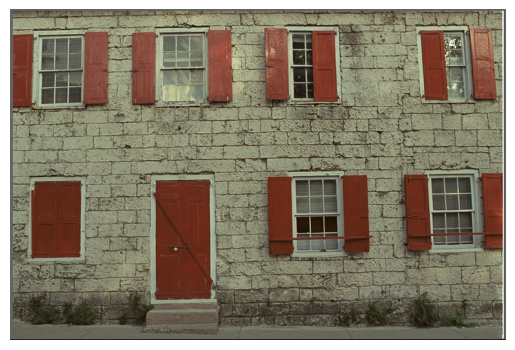

In [3]:
obraz1 = cv2.imread('kodim01.png')
pob(obraz1)

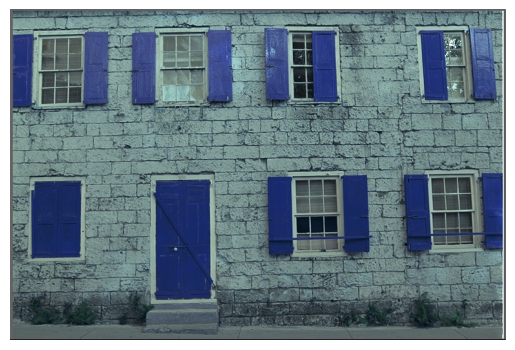

In [4]:
obraz2 = io.imread('kodim01.png')
pob(obraz2)

Powyższy obraz jest zapisany w formacie RGB, zaś funkcja 'pokaz' domyślnie interpretuje obraz w konwencji typowej dla openCV (BGR). Dla prawidłowego wyświetlenia obrazu należy wyłączyć opcję 'openCV'.

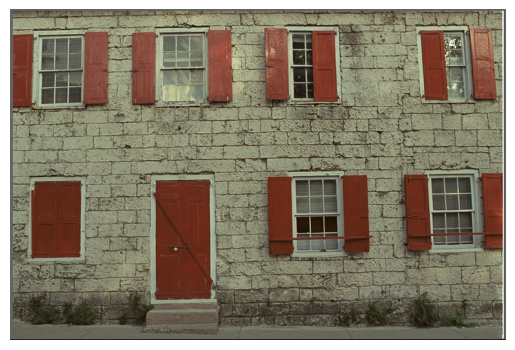

In [5]:
obraz2 = io.imread('kodim01.png')
pob(obraz2,openCV=False)

Wiele obrazów wyświetlanych obok siebie.

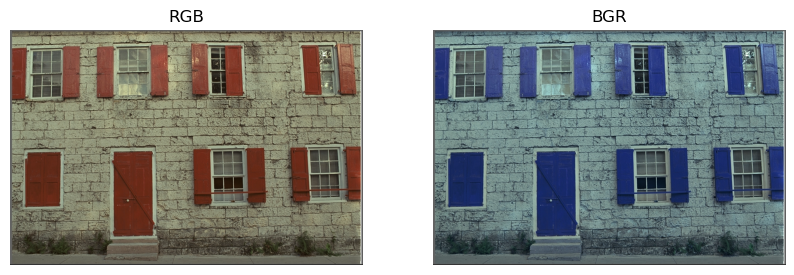

In [6]:
plo([obraz1, obraz2],2,['RGB','BGR'])

## 1.2 Krzywa tonalna, tablica korekcji i operacje arytmetyczne

Wartość piksela obrazu wyjściowego w metodach punktowych zalezy tylko i wyłącznie od piksela o tych samych współrzędnych na obrazie wejściowym. Zalezność tą opisuje **krzywa tonalna** - funkcja przedstawiająca zależność jasności na obrazie wyjściowym od jasności na obrazie wejściowym. W praktycznych zastsowaniach operację punktową realizuje się z wykorzystaniem **tablicy korekcji**, która przechowuje informację o tym jakie wartości na obrazie wyjściowym należy przypisać poszczególnym jasnościom na obrazie wejściowym.

Funkcja pakietu openCV realizująca punktową operację na obrazie z wykorzystaniem zadanej tablicy korekcji to `cv2.LUT`. Poniższy przykład pokazuje tworzenie i stosowanie tablicy korekcji realizującej operację wyznaczania negatywu obrazu.

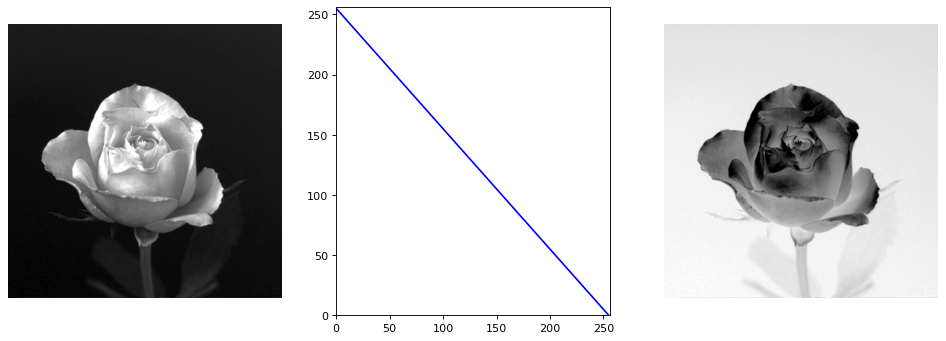

In [7]:
o = cv2.imread('rose.png')
lut = np.empty((1,256), np.uint8)
for i in range(256):
    lut[0,i] = 255 - i
polut(o,lut);

> **Zadanie** obejrzyj negatywy obrazów `baboon.jpg` oraz `lotnicze.png`. Na wszystkich oglądanych obrazach, zwacaj uwagę na czytelność detali obrazu. Czy prezentacja obrazu w formie negatywu wpływa na czytelność elementów obrazów ?

In [8]:
# miejsce na kod


Jedynymi z podstawowych operacji typu punktowego są **operacje arytmetyczne**: dodawanie, odejmowanie, mnożenie i dzielenie przez ustaloną liczbę. Dla uproszczenia eksperymentów utworzymy na początek funkcję generującą tablice korekcji dla tego typu operacji.

In [9]:
# generowanie tablicy lut dla operacji arytmetycznych
def lut_arytm(ile,mnoznik):
    lut = np.empty((1,256), np.uint8)
    for i in range(256):
         lut[0,i] = np.clip(i*mnoznik + ile, 0, 255) 
    return lut

Przy jej pomocy obejrzeć wynik operacji arytmetycznej.

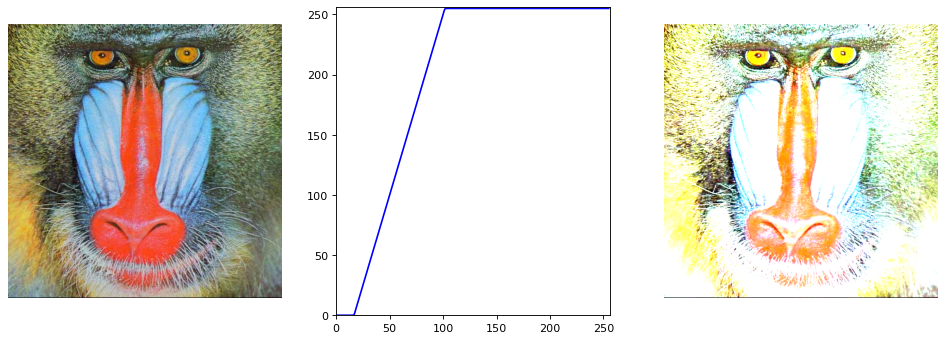

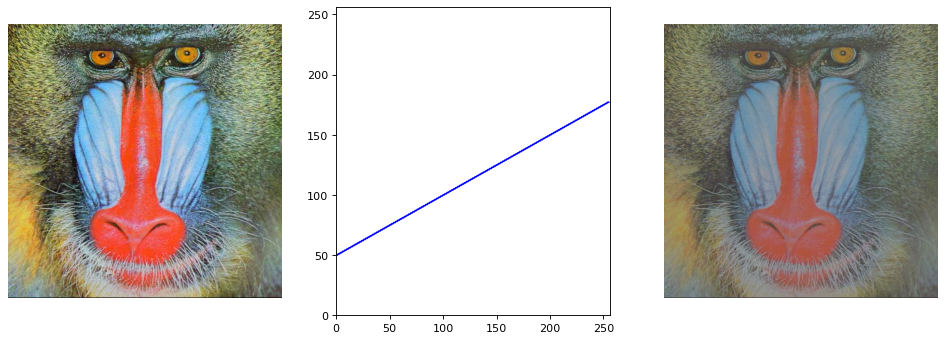

In [10]:
# operacje arytmetyczne z LUT
o = cv2.imread('baboon.jpg')
ile = -50
mnoznik = 3
polut(o,lut_arytm(ile,mnoznik));
ile = 50
mnoznik = 0.5
polut(o,lut_arytm(ile,mnoznik));

> **Zadanie** Poeksperymentuj z różnymi wartościami zmiennych `ile` (także ujemnymi) oraz `mnoznik` (także z zakresu 0...1). Jakie efekty można uzyskać przy pomocy operacji artymetycznych ? Jakie widzisz niedoskonałości tych operacji ?

> **Zadanie** Poeksperymentuj z opracjami arytmetycznymi na obrazach `rice.tif`, `rtg.tif`, `lotnicze.png`. Czy i w jaki sposób można poprawić jakość tych zdjęć ?

> **Zadanie** Jak dotychczas omówione operacje (negatyw, dodawanie, odejmowanie, mnozenie i dzielenie) wpływaja na histogram obrazu? Wykonaj stosowne eksperymenty, obejrzyj histogramy przed i po wykonaniu operacji. Do wyświetlenia obrazu wraz z jego histogramem możesz wykorzystać funkcję `pokazhist` 

In [11]:
# miejsce na kod


## 1.3 Korekcja gamma i operacje histogramowe

Korekcja **gamma**, pozwala na poprawe kontrastu obszarów jasnych kosztem ciemnych lub odwrotnie. Operacje te stosuje sie w sytuacji, gdy jasne obszary obrazu sa zbyt mało kontrastowe, zas ciemne nie odgrywaja wiekszej roli, lub odwrotnie. Na poczatek zostanie zdefiniowana funkcje generująca tablicę korekcji dla zadanego paramteru gamma. 

In [12]:
# tablica korekcji dla korekcji gamma
def lut_gamma(gamma): 
    lut = np.empty((1,256), np.uint8)
    for i in range(256):
        lut[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
    return lut

Dzięki niej możliwe jest wykonywania korekt obrazu opartych o korekcję gamma.

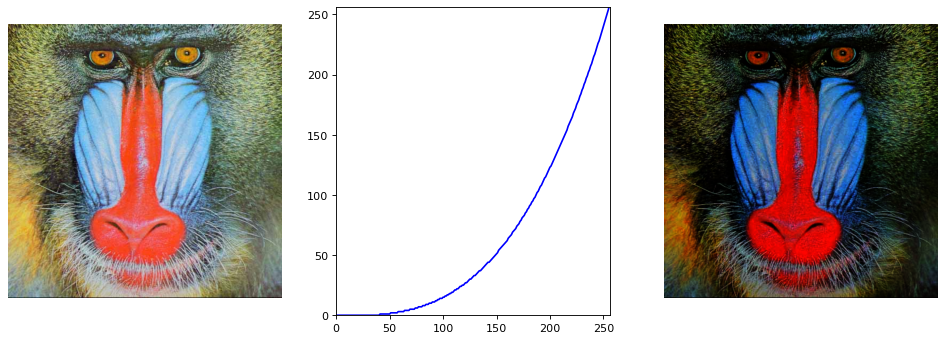

In [13]:
# korekcja gamma z LUT
gamma = 3
o1 = polut(o,lut_gamma(gamma));

Korekcja gamma powoduje zmiany widoczne także na histogramie obrazu - poniższy przykłado pokazuje histogram obrazu przed i po powyższej operacji (zwróć uwagę na skalę osi 'y' w obu przypadkach).

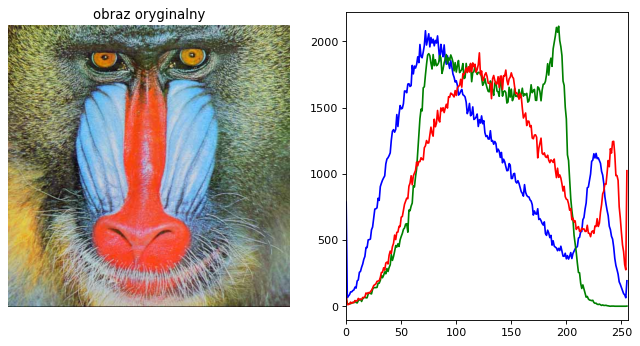

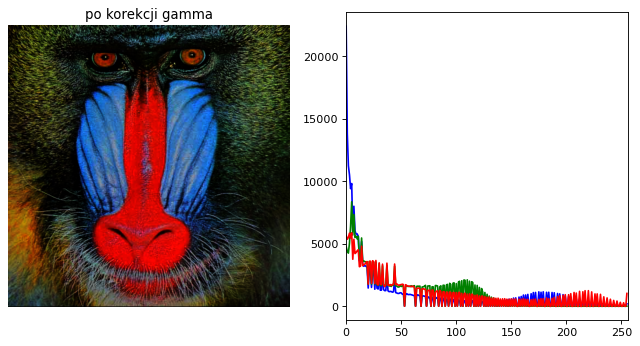

In [14]:
pohist(o,"obraz oryginalny")
pohist(o1,"po korekcji gamma")

> **Zadanie** Poeksperymentuj z różnymi wartościami `gamma`. Porównaj rozjaśnianie i pociemnianie metoda koreksji gamma oraz operacjami arytmetycznymi. Zwróć uwagę jak zmienia się obraz i jego histogram.

> **Zadanie** Poeksperymentuj z opracjami arytmetycznymi na obrazach `rice.tif`, `rtg.tif`, `lotnicze.png`. Czy i w jaki sposób można poprawić jakość tych zdjęć korzystając z korekcji gamma ? Czym różnią się efekty korekcji gamma od wyników wcześniej przetestowanych operacji arytmetycznych.

> **Korekcja gamma, inne źródła:**
* https://www.pyimagesearch.com/2015/10/05/opencv-gamma-correction/
* https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_log_gamma.html
* https://www.dynamsoft.com/codepool/image-processing-opencv-gamma-correction.html

Zdarza się, że obrazy mają zawężoną skalę jasności. Przykładowo, obraz może sprawiać wrazenie bladego przez to, ze brakuje w nim skrajnych odcieni szarosci – bliskich pełnej bieli i/lub czerni. W takim przypadku stosuje sie przekształcenie rozszerzajace skale odcieni szarosci wystepujacych w obrazie w ten sposób, by rozpoczynała sie od pełnej czerni (wartosc punktu = 0) az do pełnej bieli (wartośc punktu = 255). Operacja taka jest nazywana **rozciąganiem histogramu**. Takie
przekształcenie zwieksza kontrast obrazu przez zwiekszenie odstepów miedzy kolejnymi jasnosciami wystepujacymi w obrazie.

In [16]:
# tablica korekcji dla rozciągania histogramu
def lut_rozciag(wmin,wmax):
    lut = np.empty((1,256), np.uint8)
    for i in range(256):
        if i<wmin:
            lut[0,i] = 0
        elif i>wmax:
            lut[0,i] = 255
        else:
            lut[0,i] = int(float((i - wmin)*255)/float(wmax - wmin))
    return lut

min = 0  , max = 255


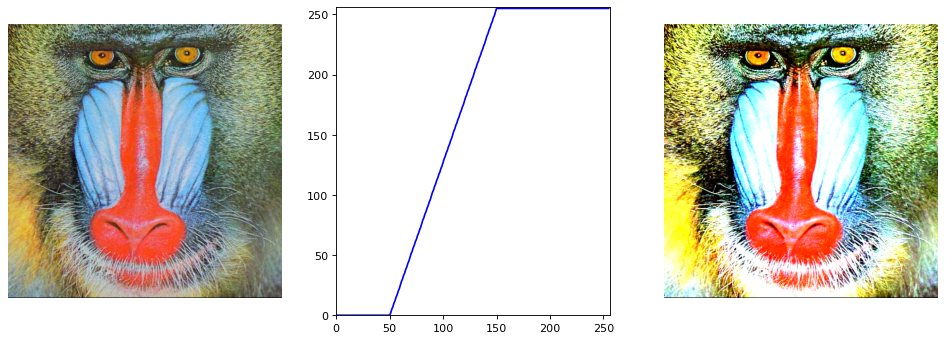

In [17]:
# rozciąganie histogramu z LUT
wmin = 50
wmax = 150
polut(o,lut_rozciag(wmin,wmax));
print('min =',o.min()," , max =",o.max())

Rozciąganie histogramu umożliwia zwiększenie kontrastu obrazów o niskiej dynamice.

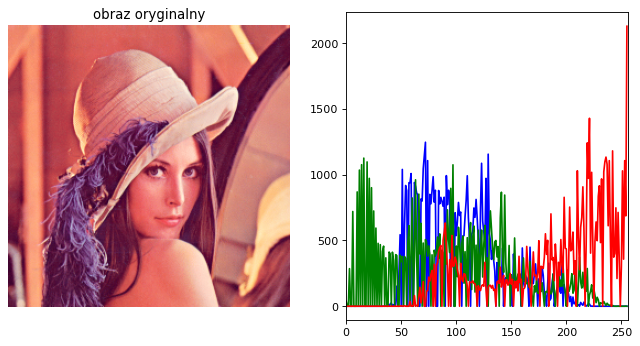

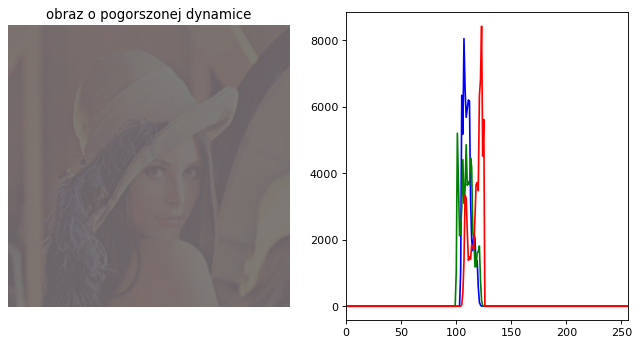

min= 100 max= 125


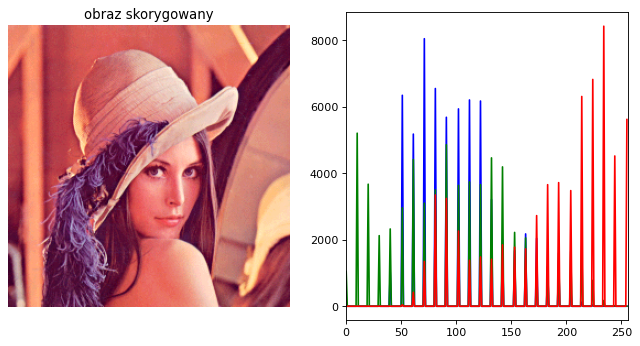

In [18]:
o = cv2.imread('lena.png')
# obraz oryginalny
pohist(o,"obraz oryginalny")
# obraz o niskiej dynamice
o2 = cv2.LUT(o,lut_arytm(100,0.1))
pohist(o2,"obraz o pogorszonej dynamice")
print("min=",o2.min(),"max=",o2.max())
# rozciągnięcie histogramu
o3 = cv2.LUT(o2,lut_rozciag(o2.min(),o2.max()))
pohist(o3,"obraz skorygowany")

> **Pytanie** Czym różni się obraz skorygowany (powyżej) od oryginalnego obrazu `lena` ?

**Wyrównywanie histogramu** polega na takim przetworzeniu obrazu wejściowego, by w efekcie powstał obraz o histogramie możliwie zbliżonym do wyrównanego tj. takiego w którym rozkład jasności jest równomierny. Funkcja `equalizeHist` realizuje wyrównywanie histogramu dla obrazu w skali szarości.


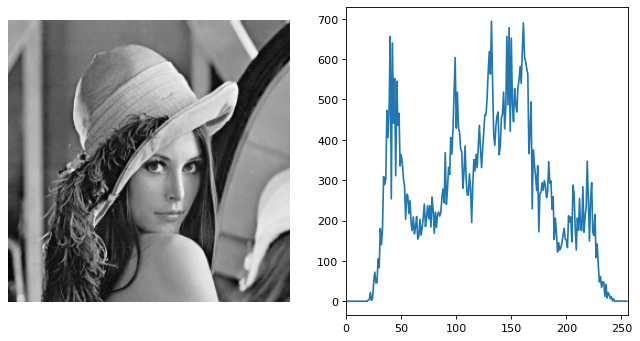

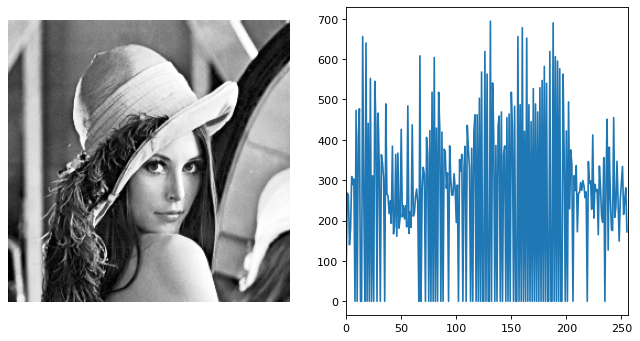

In [19]:
lena = cv2.imread('lena.png',0)
pohist(lena)
lena_wh = cv2.equalizeHist(lena)
pohist(lena_wh)

> **Zadanie** wykonaj wyrównywanie histogramu na obrazach `tire.tif` i `lotnicze.png`. Oceń rezultaty

> **Zadanie** Na podstawie opisu metody wyrównywania histogramu (materiały z wykładu lub informacje z Internetu) napisz funkcję, która dla zadanego obrazu (argumentu tej funkcji) wyznaczy tablicę korekcji operacji wyrównywania histogramu.

In [20]:
# miejsce na kod


> **Wyrównywanie histogramu, inne źródła:**
* https://coderspacket.com/histogram-equalization-in-images-using-python-and-opencv
* https://opencvpython.blogspot.com/2013/03/histograms-2-histogram-equalization.html

## 1.4 Manipulowanie poziomami jasności, progowanie 

Progowanie jest najprostszą metoda konwersji obrazu skali szarości lub kolorowego w obraz binarny. Parametrem metody jest próg lub progi określające poziom jasności odcięcia. Mogą one być ustalane manualnie lub wyznaczane automatycznie.

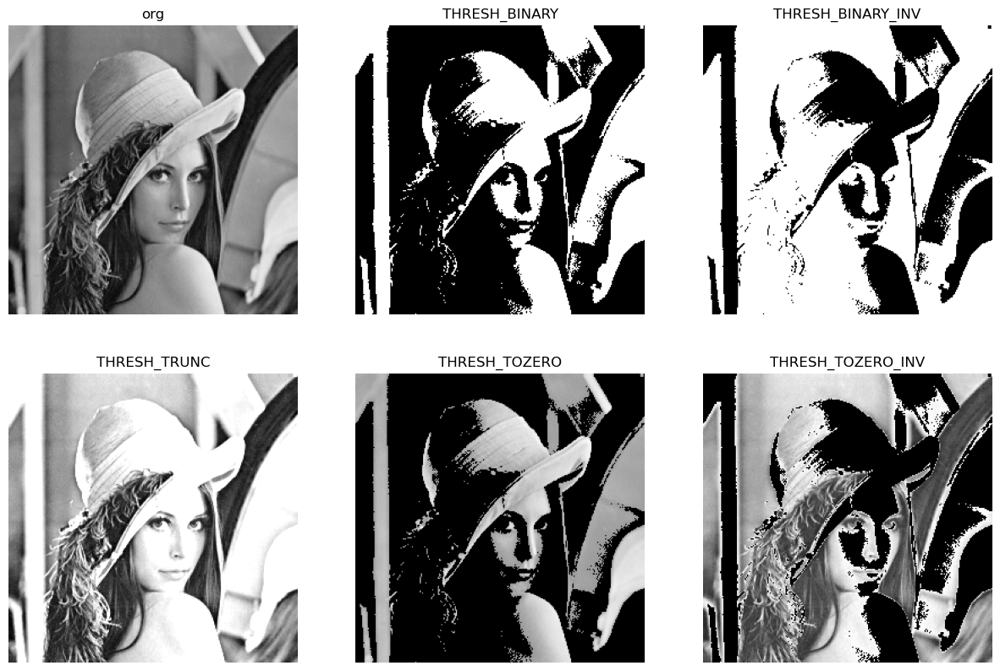

In [89]:
# progowanie obrazu w skali szarości
lena = cv2.imread('lena.png',0)
dol, gora = 150, 255
prg = np.zeros((256,256,6), np.uint8)
prg[:,:,0] = lena
ret, prg[:,:,1] = cv2.threshold(lena,dol,gora,cv2.THRESH_BINARY)
ret, prg[:,:,2] = cv2.threshold(lena,dol,gora,cv2.THRESH_BINARY_INV)
ret, prg[:,:,3] = cv2.threshold(lena,dol,gora,cv2.THRESH_TRUNC)
ret, prg[:,:,4] = cv2.threshold(lena,dol,gora,cv2.THRESH_TOZERO)
ret, prg[:,:,5] = cv2.threshold(lena,dol,gora,cv2.THRESH_TOZERO_INV)

plo([prg[:,:,i] for i in range(6)],3,
      ["org", "THRESH_BINARY", "THRESH_BINARY_INV","THRESH_TRUNC","THRESH_TOZERO","THRESH_TOZERO_INV"])

Obraz po pozycji 4 (pierwszy w drugim wierszu) wygląda jak obraz oryginalny. Ma on jednak zawężoną skalę jasności, co nie jest widoczne, gdyż komenta `imshow` dokonuje standardowo rozciągnięcia histogramu. Pokazuje to poniższy przykład - pierwszy obraz jest wyświetlany standardowo (rozciągnięcie histogramu niweluje zmiany dokonane przez funkcję `threshold`). W przypadku drugiego obrazu wymuszono pełen zakres jasności (poprzez argumenty `vmin` i `vmax`).

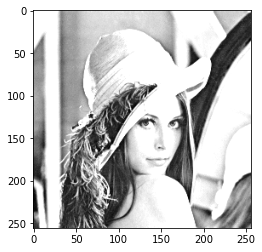

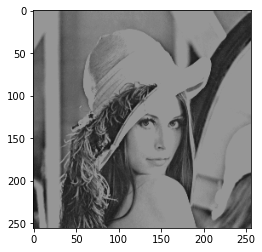

In [94]:
plt.imshow(prg[:,:,3],cmap='gray')
plt.figure()
plt.imshow(prg[:,:,3],cmap='gray',vmin = 0, vmax = 255)

> **Pytanie** Czym róznią się poszczególne wyniki progowania dla tych samych wartości progowych ?

> **Zadanie** Poeksperymentuj z różnymi wartościami progowymi. Wyświetl wyniki dla wybranego rodzaju wyniku progowania dla róznych progów w formie macierzy obrazów (tak jak w powyższym przykładzie).

> **Zadanie** wykonaj progowanie dla obrazów `kalkulator.png` oraz `rice.tif` dobierz próg tak, by na obrazie były widoczne obiekty na obrazie oryginalnym.

Najbardziej znaną metodą automatycznego doboru wartości progowej jest tzw. metoda Otsu, optymalizująca wartość progową korzystając z miar statystycznych.

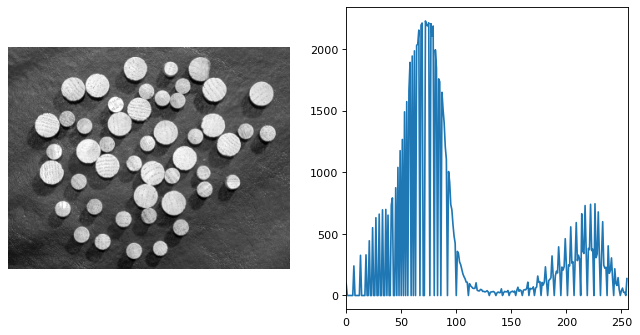

prog =  140.0


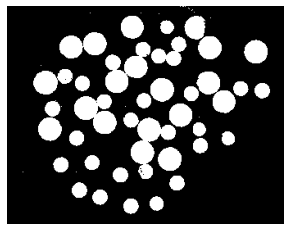

In [96]:
kola = cv2.imread('dowels.png',0)
pohist(kola)
ret, otsu = cv2.threshold(kola,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print("prog = ",ret)
pob(otsu)

> **Zadanie** Metody automatycznego doboru progu (w tym pokazana wyżej metoda Otsu) sprawdzają się najlepiej dla obrazów o histogramie bimodalnym. Obrazem takim jest obraz `dowels.png`. Powtórz powyższy przykład dla tego obrazu.

> **Zadanie** Znajdź samodzielnie metody realizujące pokazane wyżej operacje punktowe w pakiecie `scikit-image`

> **Progowanie, inne źródła:**
* https://www.geeksforgeeks.org/python-thresholding-techniques-using-opencv-set-3-otsu-thresholding/
* https://datacarpentry.org/image-processing/07-thresholding/
* https://www.meccanismocomplesso.org/en/opencv-python-the-otsus-binarization-for-thresholding/    

## 1.5 Segmentacja koloru

Obraz kolorowy składa się z pikseli będących wektorami składowych koloru. W modelu RGB są to składowe czerwona, zielona i niebieska. Piksele w danym obrazie barwnym tworzą chmurę punktów w przestrzeni barw. Zdefiniowana poniżej, funkcja `kolory_rgb` pokazuje obraz kolorowy oraz chmurę punktów w przestrzeni RGB. 

In [99]:
def kolory_rgb(obr):
    obr_rgb = cv2.cvtColor(obr, cv2.COLOR_BGR2RGB)
    r, g, b = cv2.split(obr_rgb)
    fig = plt.figure(figsize=(10,5), dpi= 80)
    plt.subplot(1,2,1)
    pob(obr)  
    axis = fig.add_subplot(1,2, 2, projection="3d")
    kolory_pikseli = obr_rgb.reshape((np.shape(obr_rgb)[0]*np.shape(obr_rgb)[1], 3))
    norm = colors.Normalize(vmin=-1.,vmax=1.)
    norm.autoscale(kolory_pikseli)
    kolory_pikseli = norm(kolory_pikseli).tolist()
    axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=kolory_pikseli, marker=".")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue")
    plt.show()
    

Przykład poniżej prezentuje przykładową chmurę punktów koloru dla prostego obrazu.

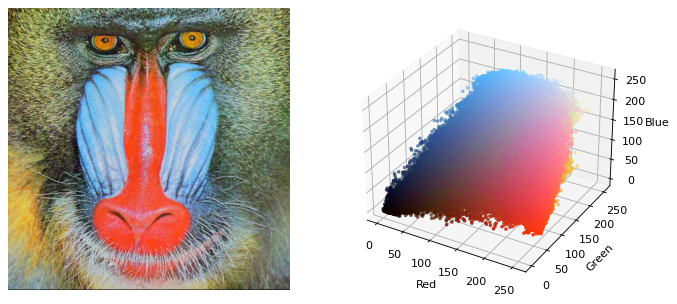

In [100]:
obr = cv2.imread('baboon.jpg')
kolory_rgb(obr)


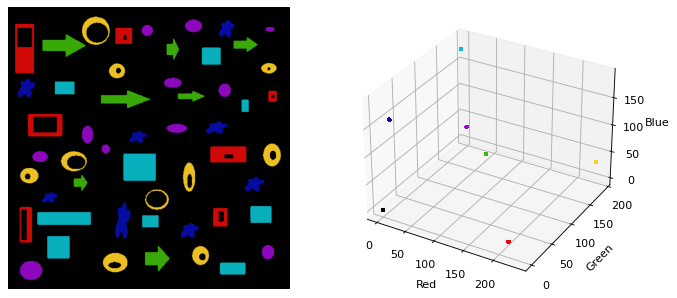

In [101]:
obr = cv2.imread('obiekty.png')
kolory_rgb(obr)


> **Zadanie** zobacz jak wyglądają chmury punktów dla innych obrazów kolorowych znajdujących się w katalogu roboczym

> **Zadanie** zobacz jak wyglądają chmury punktów dla innych obrazów kolorowych znajdujących się w katalogu roboczym

Segmentacja obrazu kolorowego przez progowanie wymaga podania zakresu kolorów, dla którym w docelowym obrazie binarnym zostaną przypisane wartości 1.  

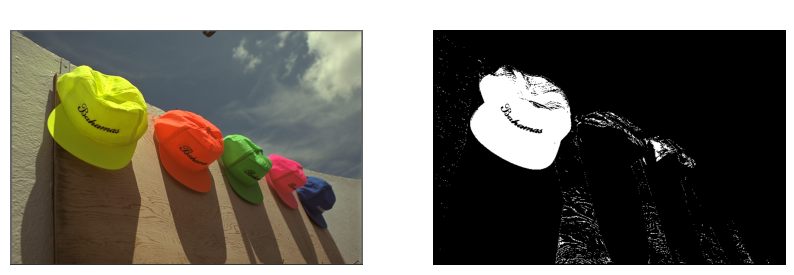

In [103]:
obr = cv2.imread('kodim03.png')
#BGR
dol = (0,90,80)
gora = (70,255,255)
bin = cv2.inRange(obr, dol, gora)
plo([obr,bin],2)

> **Zadanie** Poeksperymentuj z innymi zakresami i innymi obrazami, spróbuje wyodrębnić z obrazów dobrze rozróżnialne obiekty. 

> **Zadanie** Wykonaj podobne eksperymenty ale wybierając zakresy w innych przestrzeniach kolorów.

In [104]:
# miejsce na kod


> **Segmentacja koloru, inne źródła:**
* https://realpython.com/python-opencv-color-spaces/
* https://www.pyimagesearch.com/2014/08/04/opencv-python-color-detection/
* https://www.learnopencv.com/color-spaces-in-opencv-cpp-python/

# 2. Operacje na wielu obrazach

## 2.1 Operacje arytmetyczne

Operacje punktowe na **dwóch** obrazach umożliwiają m.in. ich łączenie w jeden poprzez zmieszanie, wyznaczanie różnicy itp.
Przykład poniżej pokazuje sumowanie dwóch obrazów na dwa sposoby - modulo (obraz `s1`) oraz z przepełnieniem (obraz `s2`).

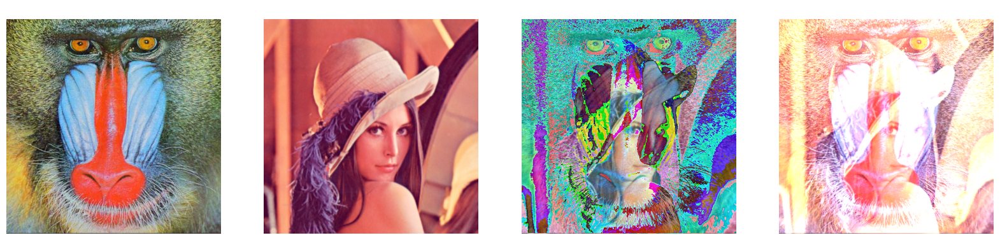

In [106]:
o1 = cv2.imread('baboon.jpg')
# funkcja imresize zmienia rozmiar obrazu
o2 = cv2.resize(cv2.imread('lena.png'),(512,512))
s1 = np.clip(o1 + o2, 0, 255)
s2 = cv2.add(o1,o2)
plo([o1, o2, s1, s2],4)


> **Pytanie** Na czym polega różnica między dwoma powyższymi wynikami ?

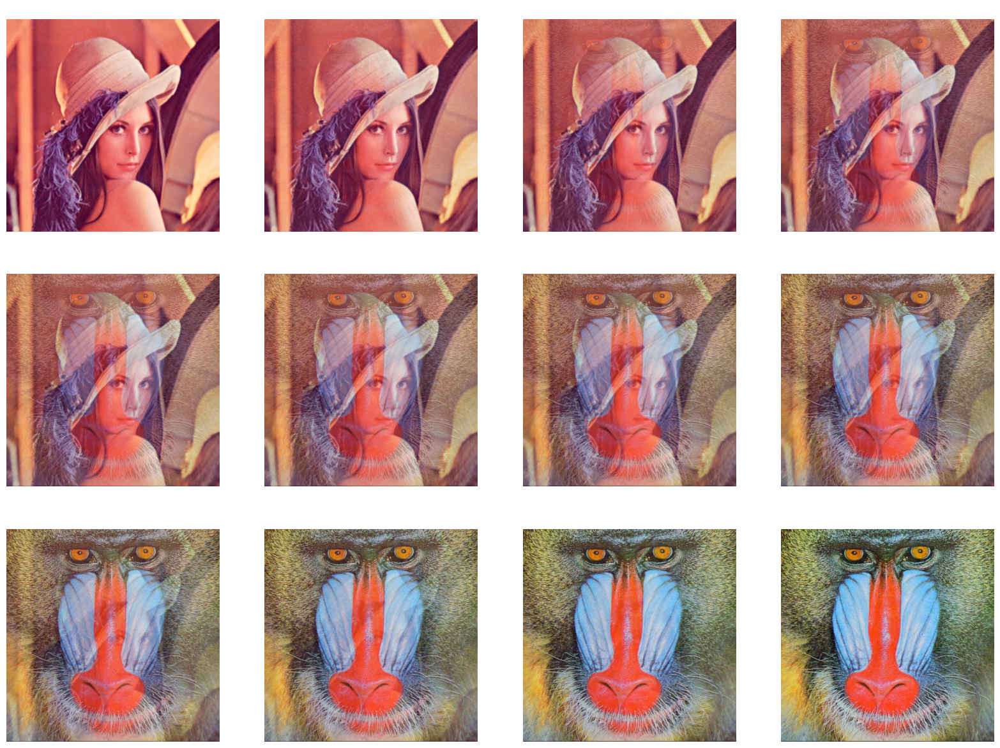

In [107]:
ile = 12
plo([cv2.addWeighted(o1,i/(ile - 1),o2,1-i/(ile - 1),0) for i in range(ile)],4)
    

## 2.2 Ukrywanie informacji

Steganografia jest nauka o ukrywaniu informacji. Obrazy cyfrowe stanowią bardzo wygodny nośnik informacji ukrytej. Najprostszy sposób ukrycia informacji w obrazie wykorzystuje ograniczenia oka ludzkiego w rozróznianiu odcieni szarości i barw o zblizonych parametrach. Dla obrazów w skali szarości zdolność oka ludzkiego do rozrózniania sasiadujacych odcieni szarosci konczy sie na skali od czystej bieli do czystej czerni składajacej sie z około 80 odcieni szarości. Oznacza to, ze przy wiekszej liczbie posrednich odcieni szarosci nie jest mozliwe rozróznienie odcieni sasiadujacych na skali. Analogicznie sytuacja wygląda w przypadku składowych koloru obrazu kolorowego. Poniższy przykład pokazuje poszczególne bity obrazu o głębi 8-bitowej (od najmniej do najbardzie znaczącego).

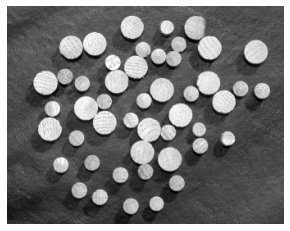

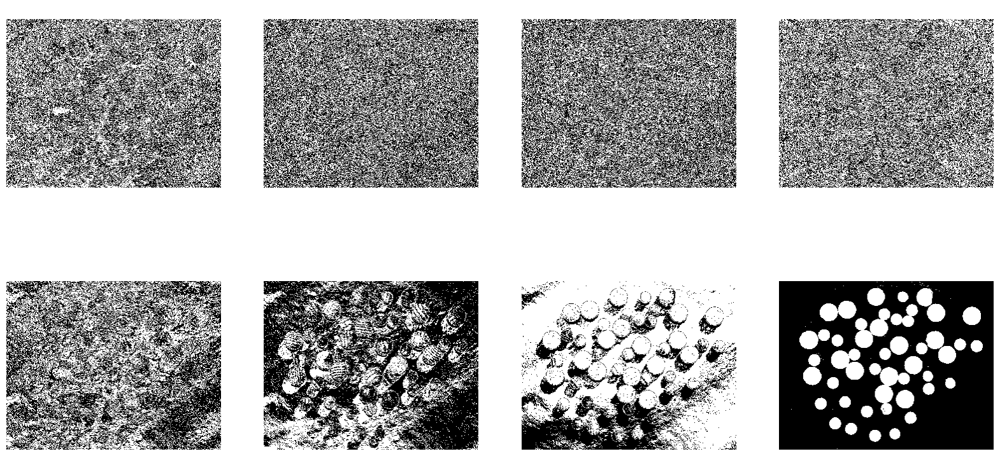

In [113]:
obr = cv2.imread('dowels.png',0)
pob(obr)
plo([np.bitwise_and(obr>>i,1) for i in range(8)],4)

Poniższy przykład pokazuje kodowanie polegające na ukryciu jednego obrazu kolorowego w innym. Każdy z obrazów jest modyfikowany w ten sposób, że odrzucane są cztery najmniej znaczące bity każdej składowej. Następnie pozostałe najbardziej znaczące bity obrazu ukrywanego sa kodowane na zwolnionych czterech najmniej znaczących bitach obrazu - nośnika.

In [27]:
print(int('11110000',2))

240


Wczytujemy dwa obrazy, pierwszy będzie nośnikiem, drugi - obrazem ukrywanym

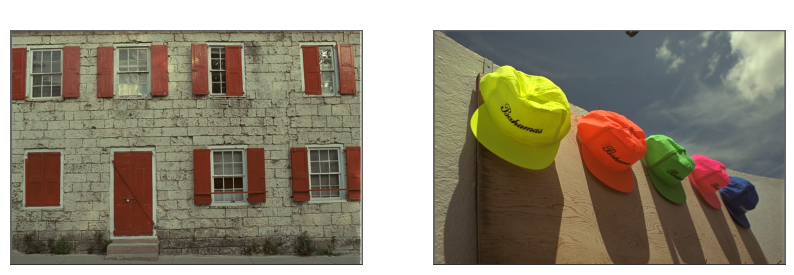

In [45]:
img1 = cv2.imread('kodim01.png') 
img2 = cv2.imread('kodim03.png') 
plo([img1,img2],2)

Rozdzielamy kazdy obraz na dwie części: 4 najbardziej (msb) i 4 najmniej (lsb) znaczące bity każdej składowej koloru (dla lepszej widoczności, na potrzeby wyświetlania najmniej znaczące bity przesuwamy o 4 w lewo)

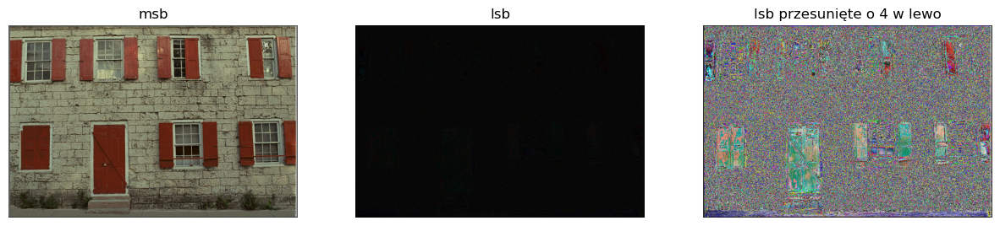

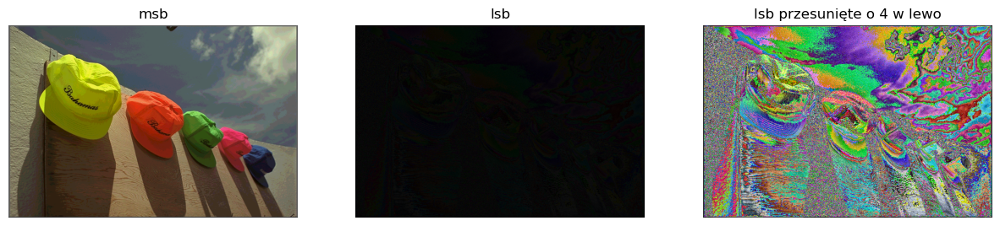

In [51]:
img1_lsb = np.bitwise_and(img1,int('1111',2))
img1_msb = np.bitwise_and(img1,int('11110000',2))
img2_lsb = np.bitwise_and(img2,int('1111',2))
img2_msb = np.bitwise_and(img2,int('11110000',2))
plo([img1_msb,img1_lsb, img1_lsb<<4],3,["msb","lsb","lsb przesunięte o 4 w lewo"])
plo([img2_msb,img2_lsb, img2_lsb<<4],3,["msb","lsb","lsb przesunięte o 4 w lewo"])

Przesuwamy 4 najbardziej znaczące bity (msb) obrazu ukrywanego o 4 w prawo, a następnie łaczymy ten obraz (bitowe 'lub') z 4 najbardzie znaczącymi bitami obraz -- nośnika. I wyświetla

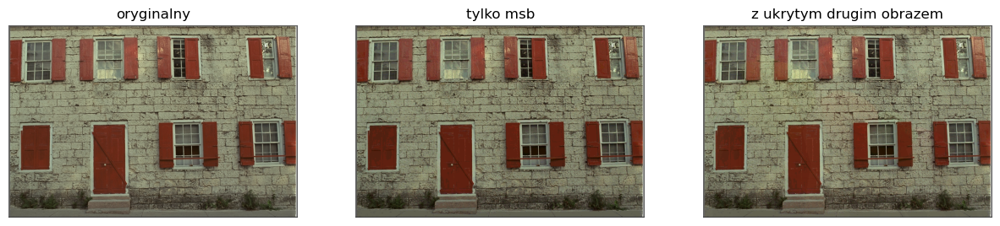

In [52]:
img_stega = np.bitwise_or(img1_msb, img2_msb>>4)
plo([img1,img1_msb,img_stega],3,["oryginalny","tylko msb","z ukrytym drugim obrazem"])

> **Pytanie** Porównaj powyższe obrazy wizualnie - czy dostrzegasz różnice ? W ostatnim z obrazów jesty ukryty obraz 'img2' !

W celu odkrycia obrazu ukrytego należy podzielić obraz steganograficzny na dwie części: 4 najbardziej i 4 najmniej znaczace bity, a następnie ten drugi przesunąć bitowo o 4 bity w prawo.

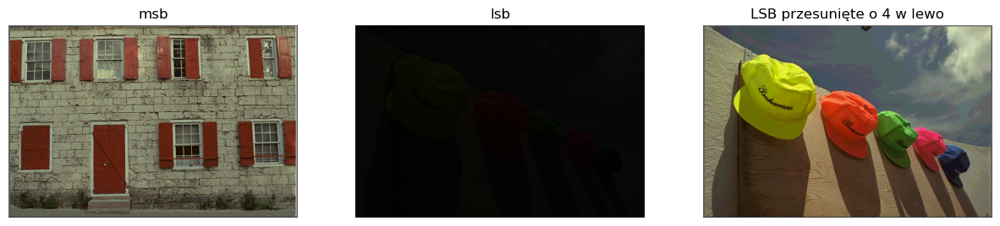

In [54]:
img_stega_lsb = np.bitwise_and(img_stega,int('1111',2))
img_stega_msb = np.bitwise_and(img_stega,int('11110000',2))
plo([img_stega_msb, img_stega_lsb, img_stega_lsb<<4],3,["msb","lsb","LSB przesunięte o 4 w lewo"])

> **Zadanie** Napisz funkcję, która będzie ukrywać obraz binarny (tj. w skali szarości o dwóch wartościach 0 i 255) na określonym bicie określonej składowej obrazu kolorowego - nośnika. Funkcja powinna posiadać cztery argumenty wejściowe: obraz nośnik, indeks składowej (0,1,2) i numer bitu (0,1,..7) na którym ukrywamy oraz obraz ukrywany. Dla sprawdzenia napisz także funkcję dekodującą, która powinna posiadać trzy argumenty: obraz w którym ukryto inny, indeks składowe i numer bitu, z którego nalezy odczytać ukryty obraz. 

## 2.3 Pseudokolorowanie

Pseudokolorowanie polega na konwersji obrazu w skali szarosci na obraz kolorowy. Jego celem jest nie tylko uatrakcyjnienie wyswietlanego obrazu, ale takze zwiekszenie jego czytelnosci. To ostatnie jest zwiazane z faktem ograniczonej zdolnosci
oka ludzkiego do rozrózniania niewiele rózniacych sie jasnosci, która powoduje, że w przypadku obrazu w skali szarości obserwator nie jest w stanie rozróżnić sąsiadujacych poziomów jasności. Wizualizacja w kolorze polepsza widoczność szczegółów obrazu.

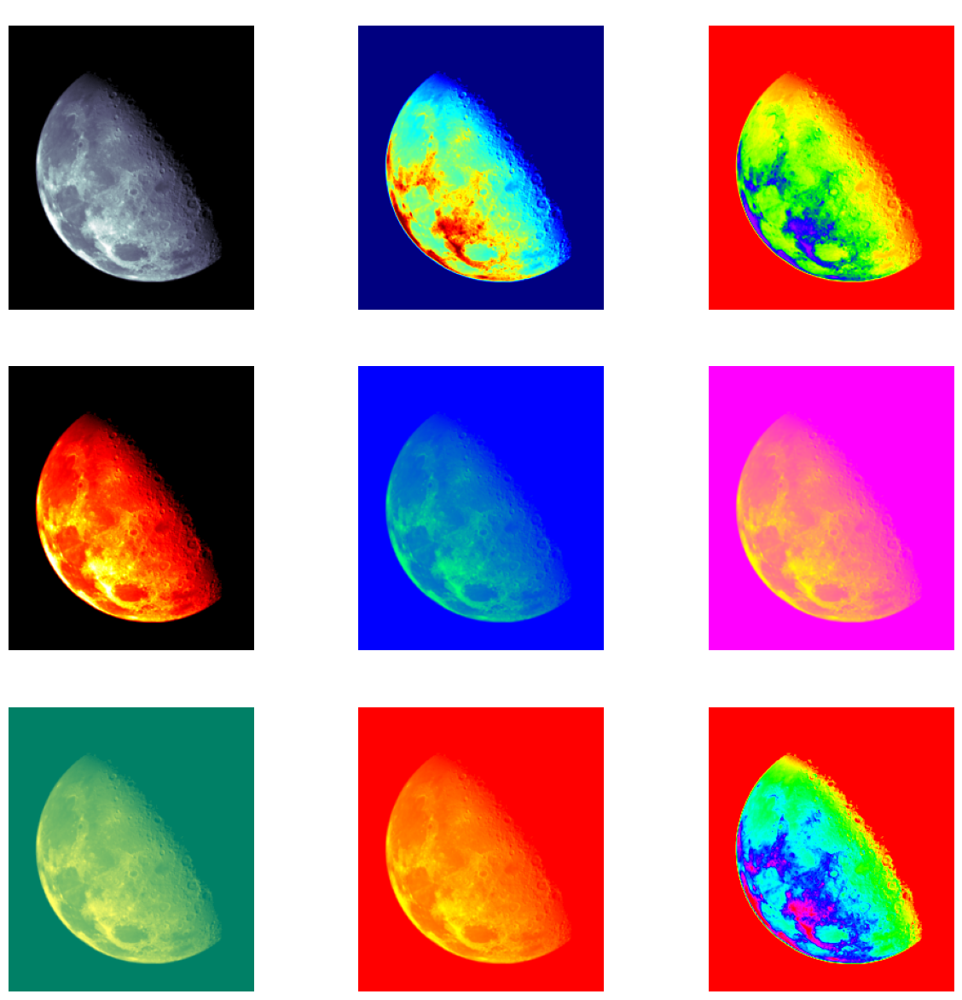

In [118]:
o = cv2.imread('moon.png',0)
mapykol = [ cv2.COLORMAP_BONE, cv2.COLORMAP_JET, cv2.COLORMAP_RAINBOW, cv2.COLORMAP_HOT, 
            cv2.COLORMAP_WINTER, cv2.COLORMAP_SPRING, cv2.COLORMAP_SUMMER, cv2.COLORMAP_AUTUMN, cv2.COLORMAP_HSV]
plo([cv2.applyColorMap(o, mkol) for mkol in mapykol],3)


> **Pytanie** Zastosowanie których z tablic kolorów pozwala na lepsze rozróżnianie detali na obrazie, a których - gorsze ? Dlaczego ?

> **Zadanie** Utwórz i zastosuj własną tablicę kolorów.

> **Pseudokolorowanie, inne źródła:**
* https://kbkb-wx-python.blogspot.com/2015/11/python-colormaps.html

---
---
Historia zmian:
* wersja pierwotna r.akad 20/21 na bazie PRiAD: 1.11.2020 (MI)
* wersja r.akad. 21/22: 27.10.2021 (MI)
* wersja r.akad. 22/23: 3.11.2022 (MI) 
* wersja uniwersalna r.akad 22/23: 26.04.2023 (MI)
* aktualizacja r.akad 23/24: 15.03.2024 (MI)